In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -U -r yolov5/requirements.txt  # install dependencies

%cd /content/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15002, done.
remote: Total 15002 (delta 0), reused 0 (delta 0), pack-reused 15002
Receiving objects: 100% (15002/15002), 14.08 MiB | 16.09 MiB/s, done.
Resolving deltas: 100% (10291/10291), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 783.1/783.1 KB 44.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 80.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 82.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 59.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.2/280.2 KB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 KB 7.9 MB/s eta 0:00:00
     ━━━

In [ ]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 KB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 9.8 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=08b8237bd62f2e214b64d8c6f0d6618bf12d707123bd80ddfb2cefa522712cbb
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pypars

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="lsfEPtz9FlRzFAst4VaT")
project = rf.workspace("workspace-pwmxu").project("tayo-seyzi")
dataset = project.version(1).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Tayo-1 in yolov5pytorch:: 100%|██████████| 1800/1800 [00:00<00:00, 2167.82it/s]


In [ ]:
!python train.py --img 640 --batch 16 --epochs 250 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Tayo-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=250, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hs

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/test/images \--save-conf

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Tayo-1/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/91 /content/yolov5/Tayo-1/test/images/1002_jpg.rf.d131639f23a81136a31dce94f23637c0.jpg: 640x640 1 car, 2 license-plates, 12.6ms
image 2/91 /content/yolov5/Tayo-1/test/images/1004_jpg.rf.0531659a038a9859709b590fc4575122.jpg: 640x640 1 car, 2 license-plates, 12.6ms
image 3/91 /content/yolov5/Tayo-1/test/images/1015_jpg.rf.b809

In [ ]:
import cv2 as cv
import torch
# Loading in yolov5s - you can switch to larger models such as yolov5m or yolov5l, or smaller such as yolov5n
model = torch.hub.load('yolov5\runs\train\exp\weights\best.pt', 'yolov5s')
img = cv.imread('/content/drive/MyDrive/unite/car_image/15.jpg')
results = model(img)
results.crop(save=True, save_dir='runs/detect/exp')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master


ImportError: ignored

In [ ]:
!python detect.py --save-crop

usage: detect.py
       [-h]
       [--weights WEIGHTS [WEIGHTS ...]]
       [--source SOURCE]
       [--data DATA]
       [--imgsz IMGSZ [IMGSZ ...]]
       [--conf-thres CONF_THRES]
       [--iou-thres IOU_THRES]
       [--max-det MAX_DET]
       [--device DEVICE]
       [--view-img]
       [--save-txt]
       [--save-conf]
       [--save-crop]
       [--nosave]
       [--classes CLASSES [CLASSES ...]]
       [--agnostic-nms]
       [--augment]
       [--visualize]
       [--update]
       [--project PROJECT]
       [--name NAME]
       [--exist-ok]
       [--line-thickness LINE_THICKNESS]
       [--hide-labels]
       [--hide-conf]
       [--half]
       [--dnn]
       [--vid-stride VID_STRIDE]
detect.py: error: unrecognized arguments: /content/yolov5/Tayo-1/test/images/


In [ ]:
import glob
import cv2 as cv
import matplotlib.pyplot as plt
import PIL
import numpy as np
import linecache

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import glob
import cv2 as cv
import matplotlib.pyplot as plt
import PIL
import numpy as np
import linecache
from google.colab.patches import cv2_imshow

img = glob.glob('/content/yolov5/Tayo-1/test/images/15_jpg.rf.62d0afca6834402c532e799f77c521ce.jpg')
dw, dh, channel = img.shape
print(dw)
for path in glob.glob('/content/yolov5/Tayo-1/test/labels/15_jpg.rf.62d0afca6834402c532e799f77c521ce.txt'):

  with open(path) as f:
    #data = f.readlines()[1]
    box = linecache.getline(path, 2).strip()
    class_id, x_center, y_center, w, h = box.strip().split()
    x_center, y_center, w, h = float(x_center), float(y_center), float(w), float(h)
    x_center = round(x_center * dw)
    y_center = round(y_center * dh)
    w = round(w * dw)
    h = round(h * dh)
    x = round(x_center - w / 2)
    y = round(y_center - h / 2)

    imgCrop = img[y:y + h, x:x + w]
    plt.figure(figsize=(12, 10))
    cv2_imshow(imgCrop)
    cv.waitKey(0)

AttributeError: ignored

In [ ]:
import glob
import cv2 as cv
import matplotlib.pyplot as plt
import PIL
import numpy as np
import linecache

from google.colab import drive
drive.mount('/content/drive')

img = cv.imread('/content/drive/MyDrive/unite/car_image/15.jpg')

for path in glob.glob('/content/yolov5/Tayo-1/test/labels/15_jpg.rf.62d0afca6834402c532e799f77c521ce.txt'):

  dh, dw, _ = img.shape
  with open(path) as f:
    #data = f.readlines()
    box = linecache.getline(path, 2).strip()
    class_id, x_center, y_center, w, h = box.strip().split()
    x_center, y_center, w, h = float(x_center), float(y_center), float(w), float(h)
    x_center = round(x_center * dw)
    y_center = round(y_center * dh)
    w = round(w * dw)
    h = round(h * dh)
    x = round(x_center - w / 2)
    y = round(y_center - h / 2)

    imgCrop = img[y:y + h, x:x + w]

Mounted at /content/drive


AttributeError: ignored

In [ ]:
class_id, x_center, y_center, w, h = box.strip().split()
x_center, y_center, w, h = float(x_center), float(y_center), float(w), float(h)
x_center = round(x_center * dw)
y_center = round(y_center * dh)
w = round(w * dw)
h = round(h * dh)
x = round(x_center - w / 2)
y = round(y_center - h / 2)

imgCrop = img[y:y + h, x:x + w]

In [ ]:
import torch

# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # or yolov5m, yolov5l, yolov5x, custom

# Images
img = 'https://ultralytics.com/images/zidane.jpg'  # or file, Path, PIL, OpenCV, numpy, list

# Inference
results = model(img)

# Results
crops = results.crop(save=True)

You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


ImportError: ignored

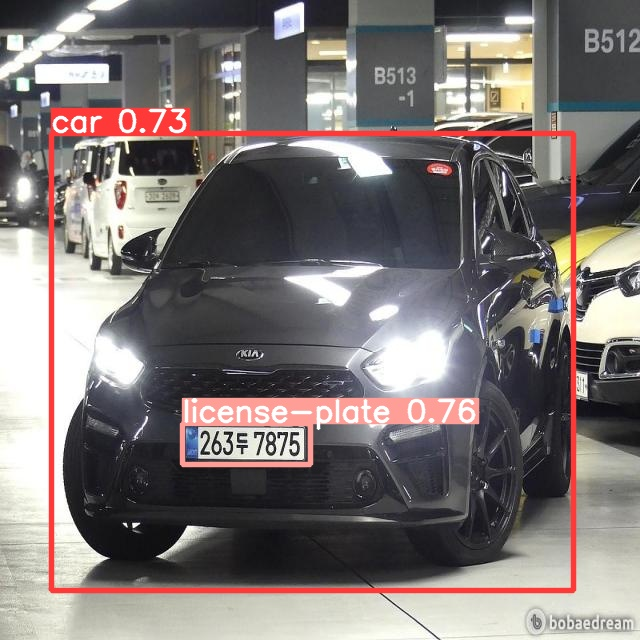

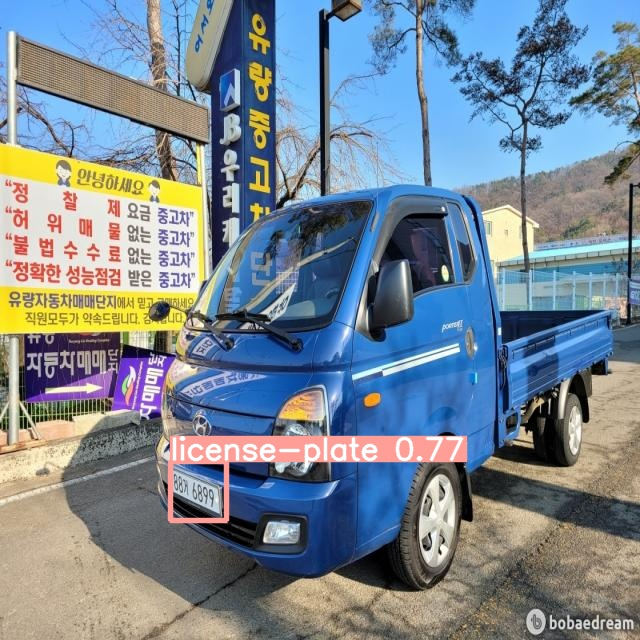

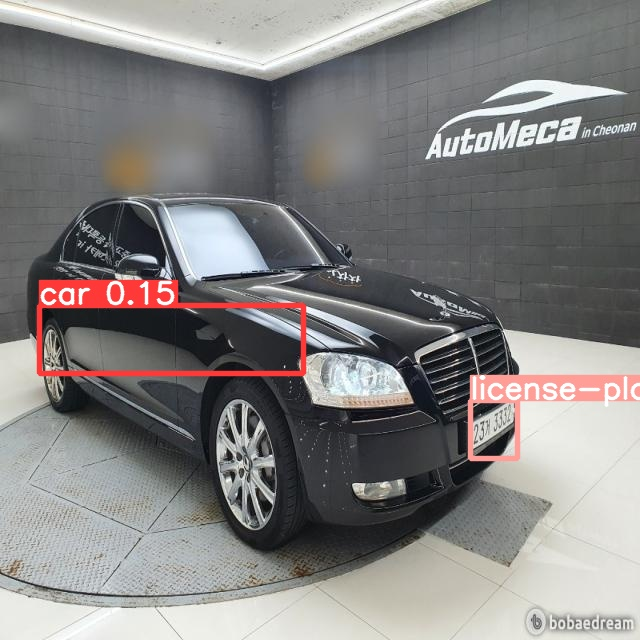

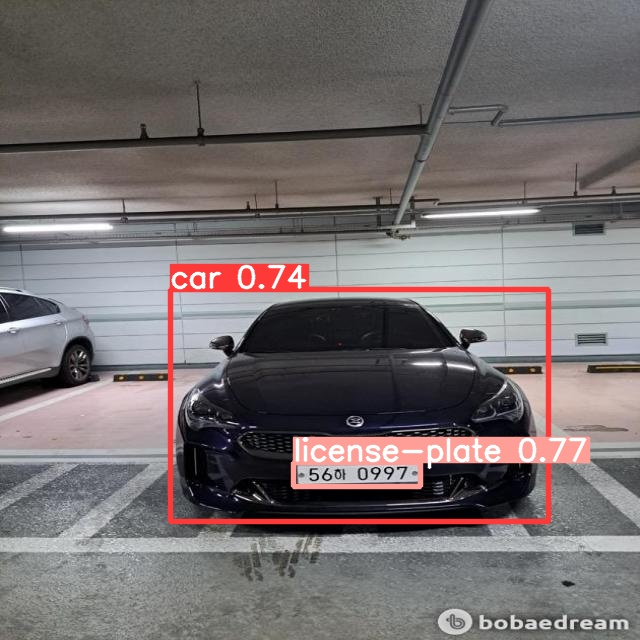

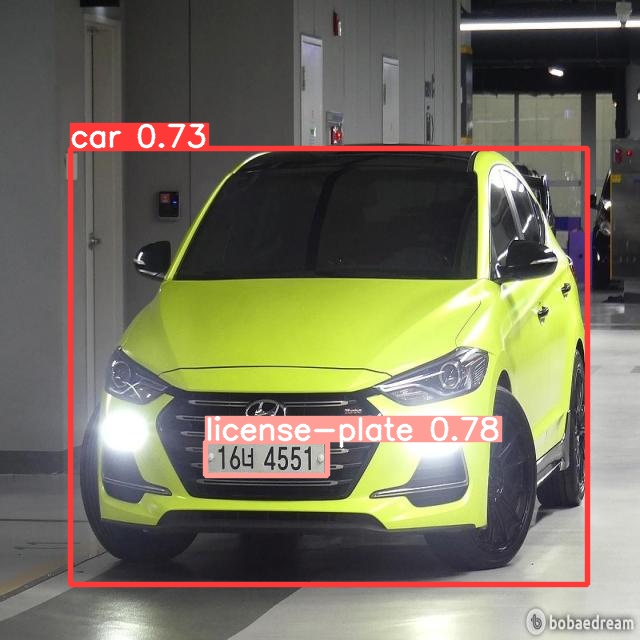

...

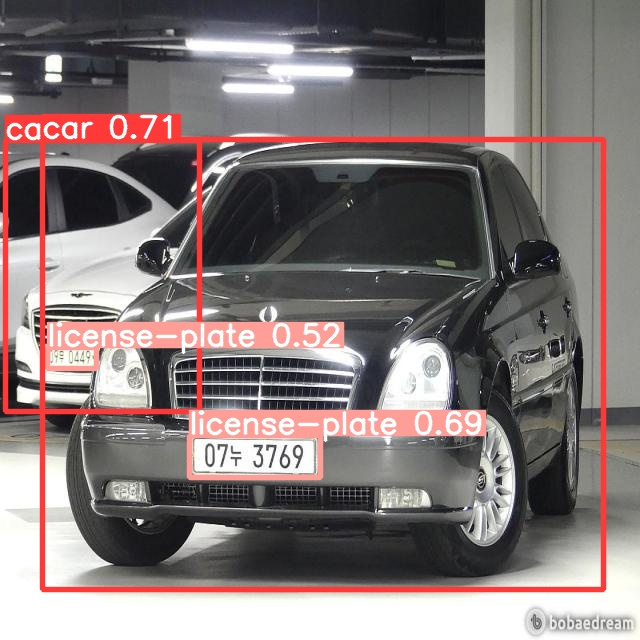

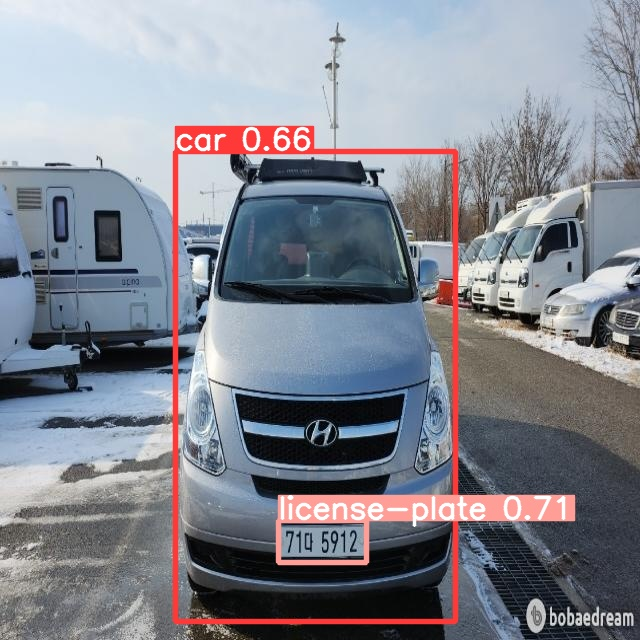

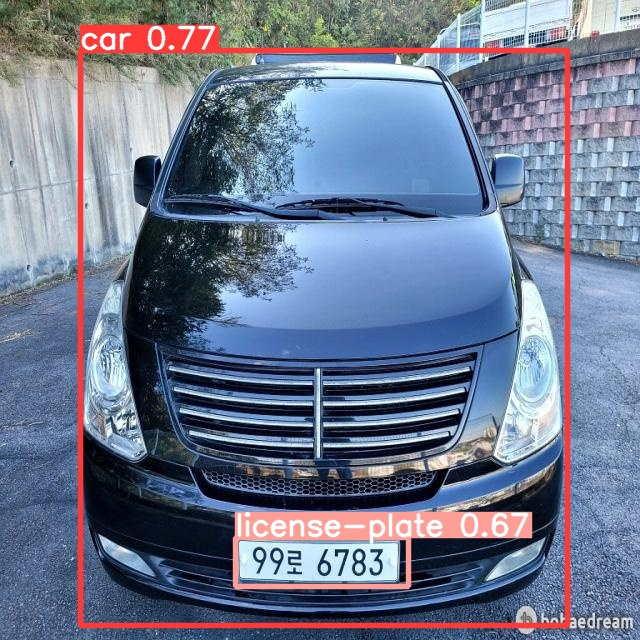

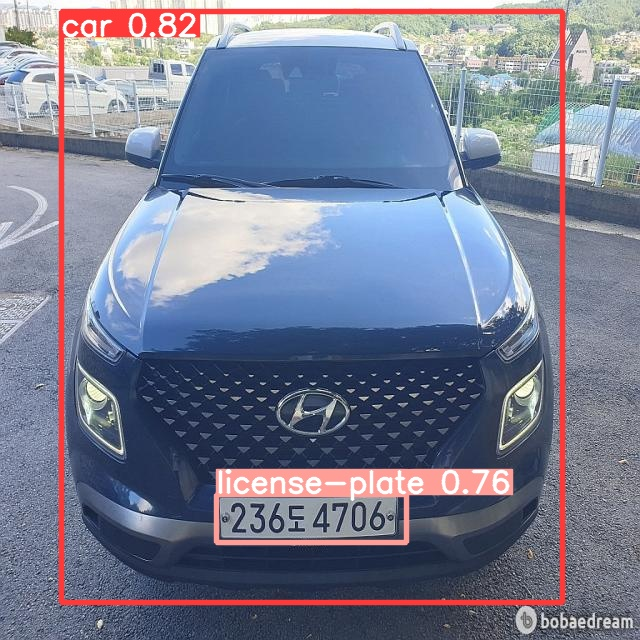

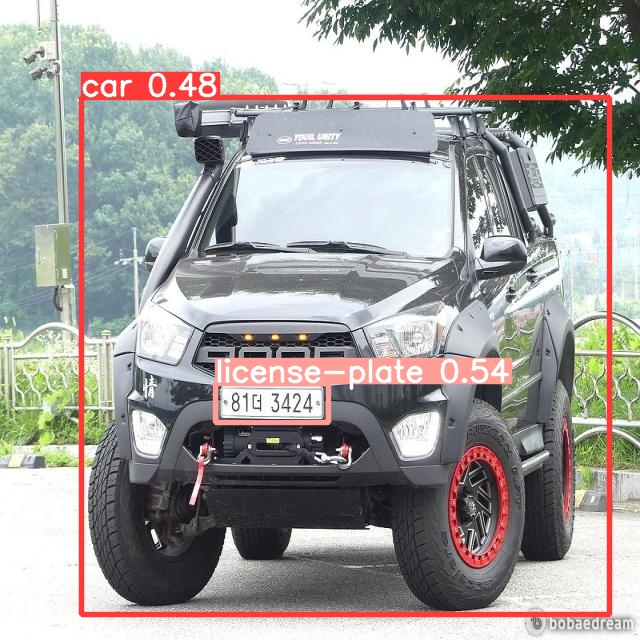

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #여기에 테스트하고 싶은 이미지 파일 넣을 것
    display(Image(filename=imageName))
    print("\n")

In [ ]:
#export your model's weights for future use
# pt파일 다운로드 (사용법 확인 필요)
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# yolov5 압축 후 다운로드

!zip -r /content/yolov5.zip /content/yolov5


  adding: content/yolov5/ (stored 0%)
  adding: content/yolov5/.github/ (stored 0%)
  adding: content/yolov5/.github/dependabot.yml (deflated 60%)
  adding: content/yolov5/.github/PULL_REQUEST_TEMPLATE.md (deflated 40%)
  adding: content/yolov5/.github/ISSUE_TEMPLATE/ (stored 0%)
  adding: content/yolov5/.github/ISSUE_TEMPLATE/bug-report.yml (deflated 59%)
  adding: content/yolov5/.github/ISSUE_TEMPLATE/config.yml (deflated 36%)
  adding: content/yolov5/.github/ISSUE_TEMPLATE/question.yml (deflated 57%)
  adding: content/yolov5/.github/ISSUE_TEMPLATE/feature-request.yml (deflated 61%)
  adding: content/yolov5/.github/workflows/ (stored 0%)
  adding: content/yolov5/.github/workflows/translate-readme.yml (deflated 47%)
  adding: content/yolov5/.github/workflows/codeql-analysis.yml (deflated 52%)
  adding: content/yolov5/.github/workflows/stale.yml (deflated 59%)
  adding: content/yolov5/.github/workflows/docker.yml (deflated 67%)
  adding: content/yolov5/.github/workflows/greetings.yml (

In [ ]:
# !cat /etc/issue.net
# !cat /proc/meminfo
# !df -h

Ubuntu 20.04.5 LTS
